In [106]:
import pandas as pd 
import numpy as np 
import datetime
import requests
import matplotlib.pyplot as plt
import seaborn as sns

import statsmodels as sm
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.dummy import DummyRegressor
from sklearn.ensemble import GradientBoostingRegressor, AdaBoostRegressor, VotingRegressor, RandomForestRegressor, ExtraTreesRegressor
from sklearn.tree import DecisionTreeRegressor

RANDOM_STATE = len("Cousin Nico, let's go bowling!")

## Data Dictionary and Glossary of Terms

## Import and Clean Steam User Behavior Dataset

The below dataset was taken from Kaggle.com, and represents steam user behaviors for 199,999 random users. The pertinent information for us in this dataset is the game title, and the user's playtime value. We'll be creating an average value of "playtime" per title, as there may be correlation between how long users play a game and how much they enjoy it. After all, it is unlikely that users are hate-playing games, though this stat could have other issues as a bad patch to a game after a user has spent hundreds of hours playing would result in a negative review.

In [2]:
steam_df = pd.read_csv(r'../datasets/steam-200k.csv')

In [3]:
steam_df

,151603712,The Elder Scrolls V Skyrim,purchase,1.0,0
0,151603712,The Elder Scrolls V Skyrim,play,273.0,0
1,151603712,Fallout 4,purchase,1.0,0
2,151603712,Fallout 4,play,87.0,0
3,151603712,Spore,purchase,1.0,0
4,151603712,Spore,play,14.9,0
...,...,...,...,...,...
199994,128470551,Titan Souls,play,1.5,0
199995,128470551,Grand Theft Auto Vice City,purchase,1.0,0
199996,128470551,Grand Theft Auto Vice City,play,1.5,0
199997,128470551,RUSH,purchase,1.0,0


In [5]:
steam_df.drop(columns = ['0'], inplace=True)
steam_df.columns = ['user_id', 'game_title','behavior','hours_played']
purchases = steam_df[steam_df['behavior'] != 'play'].index
steam_df.drop(purchases, inplace = True)
steam_df.drop('behavior', axis = 1, inplace = True)
steam_df.sort_values(['game_title'],ascending = True, inplace = True)

In [12]:
avg_df = steam_df.groupby('game_title', as_index = False)['hours_played'].mean()
avg_df

,game_title,hours_played
0,007 Legends,0.700000
1,0RBITALIS,0.400000
2,1... 2... 3... KICK IT! (Drop That Beat Like a...,4.000000
3,10 Second Ninja,2.950000
4,"10,000,000",3.600000
...,...,...
3595,rymdkapsel,1.100000
3596,sZone-Online,0.977586
3597,the static speaks my name,0.250000
3598,theHunter,2.493548


This dataset was pared down significantly from the initial 199,999 rows of data. The first cut of removing "purchased" items took a whole 130,000 rows off. The second cut, averaging the remaining content, brought it down to just a list of 3,600 games. This potentially promising dataset may no longer be relevant, depending on size of subsequent data.

## Import and Clean Metacritic Dataset

The below dataset also comes from Kaggle.com. It consists of 10,451 rows of data corresponding to titles reviewed on the Metacritic website between the years 2000 and 2018. Each row corresponds to a game on a platform, so there may be 3 rows for the same game, one for each platform. We only care about the PC games, so will be filtering out every value in the console column that isn't 'PC'.  
  
This dataset will form the core of our data, as games that are listed here but aren't listed or reviewed on Steam will form our training set.

In [13]:
meta_df = pd.read_csv(r'../datasets/result.csv')

In [14]:
meta_df

,metascore,name,console,userscore,date
0,97,Grand Theft Auto V,PS3,8.3,"Sep 17, 2013"
1,97,Grand Theft Auto V,X360,8.3,"Sep 17, 2013"
2,95,The Last of Us,PS3,9.2,"Jun 14, 2013"
3,94,BioShock Infinite,PS3,8.5,"Mar 26, 2013"
4,94,BioShock Infinite,PC,8.6,"Mar 25, 2013"
...,...,...,...,...,...
15642,38,Touhou Kobuto V: Burst Battle,Switch,4.6,"Oct 10, 2017"
15643,38,Randall,PS4,2.1,"Jun 6, 2017"
15644,36,Tokyo Tattoo Girls,VITA,5.4,"Nov 14, 2017"
15645,26,Road Rage,PS4,2.5,"Nov 14, 2017"


In [17]:
meta_df.sort_values(['name'],ascending = True, inplace = True)
console_games = meta_df[meta_df['console'] != 'PC'].index
meta_df.drop(console_games, inplace = True)
string_scores = meta_df[meta_df['userscore'] == 'tbd'].index
meta_df.drop(string_scores, inplace = True)
meta_df = meta_df.reset_index()
meta_df.drop('index', axis = 1, inplace = True)
meta_df['date'] = pd.to_datetime(meta_df['date'])

In [25]:
meta_df

,metascore,name,console,userscore,date
0,69,.hack//G.U. Last Recode,PC,6.5,2017-11-03
1,59,007: NightFire,PC,6,2002-11-28
2,70,007: Quantum of Solace,PC,6.1,2008-11-04
3,73,0RBITALIS,PC,7.3,2015-05-28
4,72,10 Second Ninja,PC,7.4,2014-03-05
...,...,...,...,...,...
3785,62,continue?9876543210,PC,6.3,2014-01-03
3786,59,inMomentum,PC,5.2,2011-10-31
3787,66,kill.switch,PC,7.4,2004-03-30
3788,69,nail'd,PC,7.7,2010-11-30


After all cleaning, our dataset of 10,000 games has been brought down to just under 4,000 titles, a respectable size for our dataset. We will need to fill in values for the Steam userscore on lines where the game is listed on Steam, and that will give us ready training (lines with Steam scores) and testing (lines without) sets.

## Import and EDA on MetaCritic Data with Gathered Reviews

The below dataset was collected by exporting the Metacritic dataset generated above as a CSV and manually imputing review_score, review_percent_score, and app_id into the .csv file before importing it back in. Despite communication with the developers of SteamSpy and SteamDB, the two most reliable data aggregators, regarding scraping for data or downloading their gathered data, neither site's servers had the capacity to handle a web-scraper, and didn't store review data locally.  
  
While a Steam Python API exists, the documentation is not very good and, like all other scrape methods I'd use, reliant on the app_id integer, a number that cannot be gathered without scraping the whole Steam library, as Steam doesn't have a way to "reverse search" a title against its app_id in the API. The only option was therefore to impute data by hand. A humongous thanks to SteamDB's developers, who helped me verify the data after the imputing process.  
  
Note that older titles on Steam are often rereleased under new names or editions, often with all the content bundled and any release bugs patched. If I could not readily verify by tracing the release dates of the packages that the listed game was the same as the one reviewed on Metacritic, I skipped over it to avoid using incorrect data. I estimate that this method of data curation cost me approximately 200 rows of data, or 5% of my overall data.

In [27]:
scores_df = pd.read_csv(r'../datasets/df_for_data.csv')
scores_df

,metascore,name,console,userscore,release_date,app_id,review_score,review_percent_score
0,69,.hack//G.U. Last Recode,PC,6.5,2017-11-03,525480.0,8.0,87.0
1,59,007: NightFire,PC,6.0,2002-11-28,NaN,NaN,NaN
2,70,007: Quantum of Solace,PC,6.1,2008-11-04,NaN,NaN,NaN
3,73,0RBITALIS,PC,7.3,2015-05-28,278440.0,6.0,71.0
4,72,10 Second Ninja,PC,7.4,2014-03-05,271670.0,8.0,85.0
...,...,...,...,...,...,...,...,...
3785,62,continue?9876543210,PC,6.3,2014-01-03,263340.0,5.0,56.0
3786,59,inMomentum,PC,5.2,2011-10-31,110400.0,6.0,75.0
3787,66,kill.switch,PC,7.4,2004-03-30,NaN,NaN,NaN
3788,69,nail'd,PC,7.7,2010-11-30,40380.0,6.0,79.0


## Study Correlation of Hours Played and Score

In [28]:
games_time_df = pd.merge(left=scores_df, right=avg_df, left_on='name', right_on='game_title')
games_time_df

,metascore,name,console,userscore,release_date,app_id,review_score,review_percent_score,game_title,hours_played
0,73,0RBITALIS,PC,7.3,2015-05-28,278440.0,6.0,71.0,0RBITALIS,0.400000
1,72,10 Second Ninja,PC,7.4,2014-03-05,271670.0,8.0,85.0,10 Second Ninja,2.950000
2,66,A Bird Story,PC,7.0,2014-11-07,327410.0,8.0,83.0,A Bird Story,1.657143
3,68,A Golden Wake,PC,6.0,2014-10-09,307570.0,6.0,70.0,A Golden Wake,1.200000
4,73,A Story About My Uncle,PC,7.2,2014-05-28,278360.0,8.0,91.0,A Story About My Uncle,3.400000
...,...,...,...,...,...,...,...,...,...,...
804,55,Zack Zero,PC,7.3,2013-04-29,234290.0,5.0,64.0,Zack Zero,7.033333
805,77,Zeno Clash,PC,7.8,2009-04-21,22200.0,8.0,84.0,Zeno Clash,1.675000
806,72,Zombie Army Trilogy,PC,7.2,2015-03-06,301640.0,8.0,87.0,Zombie Army Trilogy,4.400000
807,60,Zombie Driver,PC,6.4,2009-12-04,416680.0,8.0,93.0,Zombie Driver,1.637500


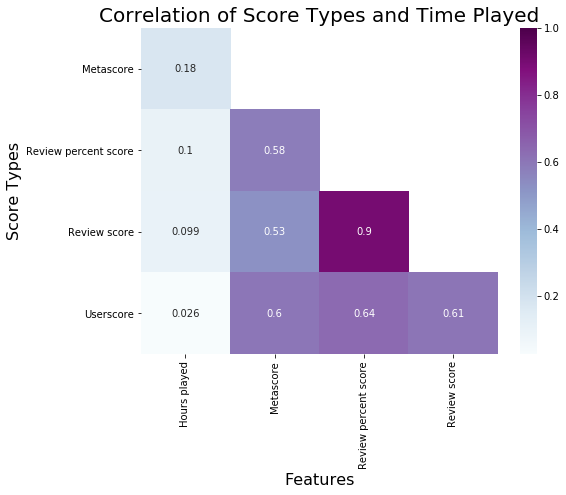

In [29]:
#The below code was modified from the Week 4.2 lesson on Visualiziations by Mahdi Shadkam-Farrokhi.
#Data prep block
corr = games_time_df.corr()
corr.drop('app_id', axis=1, inplace=True)
corr.drop('app_id', axis=0, inplace=True)
col_order = corr.sort_values('hours_played', ascending=False).index
ordered_df = games_time_df[col_order]
ordered_df.columns = ordered_df.columns.str.replace("_"," ").str.capitalize()

#Plotting block
fig = plt.figure(figsize=(8,6))
mask = np.triu(np.ones_like(corr))
ax = sns.heatmap(ordered_df.corr(), annot=True, mask = mask, cmap = 'BuPu')
ax.set_title('Correlation of Score Types and Time Played', fontsize=20)
ax.set_xlabel('Features', fontsize = 16)
ax.set_ylabel('Score Types', fontsize = 16)
y_min, y_max = ax.get_ylim()
x_min, x_max = ax.get_xlim()
ax.set_ylim(top=y_max+1)
ax.set_xlim(right=x_max-1);

My earlier concern about hours_played having a possible low correlation was well founded. However, there is still a non-zero correlation, and given that we are low on features, I will be implementing it.
  
More curiously though is the weaker correlation between metascore and any other metrics. Even Userscore, a metric from the Metacritic website that focuses solely on user/non-professional reviews, doesn't really tie to the Metascore strongly. The only two very strongly correlated metrics are Review Percent Score and Review Score, two metrics from Steam that are derived from different datasets but generally are very close.

## Generate Training and Testing Datasets

In [30]:
games_df = pd.merge(left=scores_df, right=avg_df, how='left', left_on='name', right_on='game_title')
games_df

,metascore,name,console,userscore,release_date,app_id,review_score,review_percent_score,game_title,hours_played
0,69,.hack//G.U. Last Recode,PC,6.5,2017-11-03,525480.0,8.0,87.0,NaN,NaN
1,59,007: NightFire,PC,6.0,2002-11-28,NaN,NaN,NaN,NaN,NaN
2,70,007: Quantum of Solace,PC,6.1,2008-11-04,NaN,NaN,NaN,NaN,NaN
3,73,0RBITALIS,PC,7.3,2015-05-28,278440.0,6.0,71.0,0RBITALIS,0.40
4,72,10 Second Ninja,PC,7.4,2014-03-05,271670.0,8.0,85.0,10 Second Ninja,2.95
...,...,...,...,...,...,...,...,...,...,...
3785,62,continue?9876543210,PC,6.3,2014-01-03,263340.0,5.0,56.0,NaN,NaN
3786,59,inMomentum,PC,5.2,2011-10-31,110400.0,6.0,75.0,inMomentum,0.25
3787,66,kill.switch,PC,7.4,2004-03-30,NaN,NaN,NaN,NaN,NaN
3788,69,nail'd,PC,7.7,2010-11-30,40380.0,6.0,79.0,NaN,NaN


In [31]:
games_df.drop(['game_title', 'app_id', 'review_score'], axis=1, inplace=True)
games_df['meta_meta'] = games_df['metascore']*games_df['userscore']
games_df['hours_played'].fillna(0, inplace = True)
games_df['played_dummy'] = games_df['hours_played'].astype(bool).astype(int)
games_df

,metascore,name,console,userscore,release_date,review_percent_score,hours_played,meta_meta,played_dummy
0,69,.hack//G.U. Last Recode,PC,6.5,2017-11-03,87.0,0.00,448.5,0
1,59,007: NightFire,PC,6.0,2002-11-28,NaN,0.00,354.0,0
2,70,007: Quantum of Solace,PC,6.1,2008-11-04,NaN,0.00,427.0,0
3,73,0RBITALIS,PC,7.3,2015-05-28,71.0,0.40,532.9,1
4,72,10 Second Ninja,PC,7.4,2014-03-05,85.0,2.95,532.8,1
...,...,...,...,...,...,...,...,...,...
3785,62,continue?9876543210,PC,6.3,2014-01-03,56.0,0.00,390.6,0
3786,59,inMomentum,PC,5.2,2011-10-31,75.0,0.25,306.8,1
3787,66,kill.switch,PC,7.4,2004-03-30,NaN,0.00,488.4,0
3788,69,nail'd,PC,7.7,2010-11-30,79.0,0.00,531.3,0


In [32]:
train = games_df[games_df['review_percent_score'] >= 1] #1 is the lowest review score we found, and I do not want to impute placeholders for NaNs
train

,metascore,name,console,userscore,release_date,review_percent_score,hours_played,meta_meta,played_dummy
0,69,.hack//G.U. Last Recode,PC,6.5,2017-11-03,87.0,0.00,448.5,0
3,73,0RBITALIS,PC,7.3,2015-05-28,71.0,0.40,532.9,1
4,72,10 Second Ninja,PC,7.4,2014-03-05,85.0,2.95,532.8,1
7,58,1954: Alcatraz,PC,6.3,2014-03-11,73.0,0.00,365.4,0
8,80,1979 Revolution: Black Friday,PC,7.7,2016-04-05,76.0,0.00,616.0,0
...,...,...,...,...,...,...,...,...,...
3784,79,Zwei: The Ilvard Insurrection,PC,8.2,2017-10-31,97.0,0.00,647.8,0
3785,62,continue?9876543210,PC,6.3,2014-01-03,56.0,0.00,390.6,0
3786,59,inMomentum,PC,5.2,2011-10-31,75.0,0.25,306.8,1
3788,69,nail'd,PC,7.7,2010-11-30,79.0,0.00,531.3,0


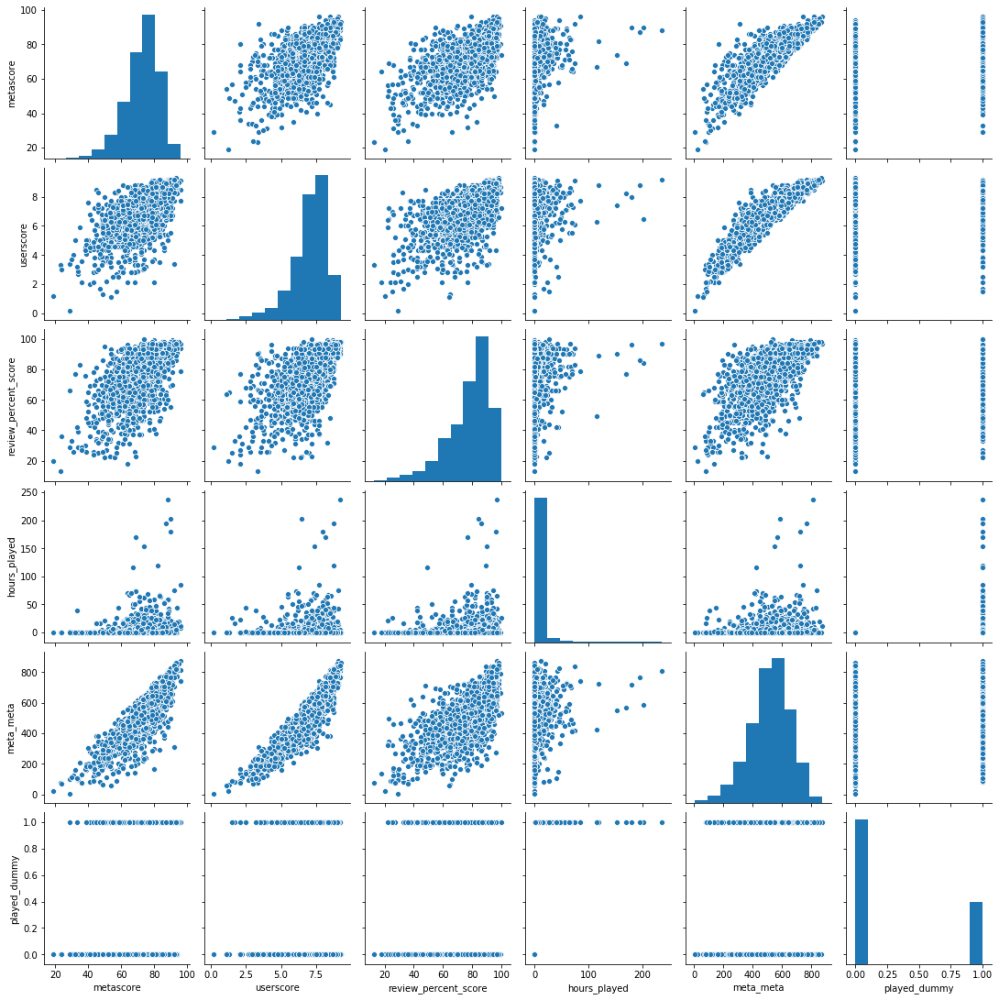

In [33]:
sns.pairplot(train);

There is a general linear trend to our data. meta_meta definitely helped reduce the variance between userscore and metascore that was previously prevalent. Time played doesn't really have a strong correlation to anything, as was expected, but any relationship is a good relationship given that we are feature-light in this model.

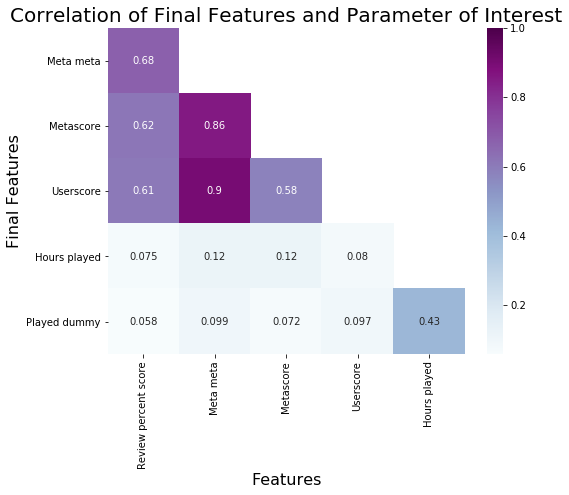

In [34]:
#The below code was modified from the Week 4.2 lesson on Visualiziations by Mahdi Shadkam-Farrokhi.
#Data prep block
corr = train.corr()
col_order = corr.sort_values('review_percent_score', ascending=False).index
ordered_df = train[col_order]
ordered_df.columns = ordered_df.columns.str.replace("_"," ").str.capitalize()

#Plotting block
fig = plt.figure(figsize=(8,6))
mask = np.triu(np.ones_like(corr))
ax = sns.heatmap(ordered_df.corr(), annot=True, mask = mask, cmap = 'BuPu')
ax.set_title('Correlation of Final Features and Parameter of Interest', fontsize=20)
ax.set_xlabel('Features', fontsize = 16)
ax.set_ylabel('Final Features', fontsize = 16)
y_min, y_max = ax.get_ylim()
x_min, x_max = ax.get_xlim()
ax.set_ylim(top=y_max+1)
ax.set_xlim(right=x_max-1);

In [35]:
test = games_df[games_df['review_percent_score'].isnull()]
test

,metascore,name,console,userscore,release_date,review_percent_score,hours_played,meta_meta,played_dummy
1,59,007: NightFire,PC,6.0,2002-11-28,NaN,0.0,354.0,0
2,70,007: Quantum of Solace,PC,6.1,2008-11-04,NaN,0.0,427.0,0
5,74,1503 A.D. - The New World,PC,7.6,2003-03-23,NaN,0.0,562.4,0
6,79,1701 A.D.,PC,8.2,2006-11-06,NaN,0.0,647.8,0
9,69,1nsane,PC,7.6,2001-02-05,NaN,0.0,524.4,0
...,...,...,...,...,...,...,...,...,...
3779,68,Zoo Tycoon 2001,PC,7.7,2001-10-17,NaN,0.0,523.6,0
3780,64,Zoo Tycoon 2: Endangered Species,PC,7.8,2005-10-19,NaN,0.0,499.2,0
3781,67,Zoo Tycoon: Dinosaur Digs,PC,7.1,2002-05-19,NaN,0.0,475.7,0
3782,71,Zoo Tycoon: Marine Mania,PC,7.4,2002-10-21,NaN,0.0,525.4,0


This is a very aggressive training vs. holdout split. There is just over a 60:40 split of training to testing data. Unfortunately, a number of titles listed in the Metacritic dataset were either never distributed by Steam, or were removed when major publishing companies like Electronic Arts and Activiation-Blizzard released their own distribution platforms and pulled the majority of their content from Steam.

## Modeling

### Defining X & y

In [103]:
features = ['metascore','userscore','meta_meta', 'hours_played', 'played_dummy']

X = train[features]
y = train['review_percent_score']

In [37]:
X_train,X_test,y_train,y_test = train_test_split(X,y,random_state = RANDOM_STATE)

### Baseline Model

In [38]:
dummy = DummyRegressor()
dummy.fit(X_train, y_train)
bl_train = dummy.predict(X_train)
bl_test = dummy.predict(X_test)

In [58]:
def get_scores(model, preds_name):
    print('Training Score:'+str(model.score(X_train,y_train)))  
    print('Testing Score:'+str(model.score(X_test,y_test)))  
    #print('Cross Val Score:'+str(cross_val_score(model,X,y).mean()))
    print('Test RMSE:'+str(np.sqrt(mean_squared_error(y_test, preds_name))))

In [40]:
get_scores(dummy, bl_test)

Training Score:0.0
Testing Score:-0.0002625794478212651
Cross Val Score:-0.003715622033557908
Test RMSE:14.834587224307775


This is, hopefully, not a difficult bar to beat. After all, you need only get on the first step to get out of the basement, and these scores are predictably bad. Our RMSE is just shy of 15 points, meaning that for a given game, the best this model can do is predict a 30-point spread, which is an unacceptable level of variance.

## Linear Regression Models

There was a "blob" effect in the earlier data we saw, but also visible linear trend. Due that trend, we are starting with a basic Linear Regression model.

### Standard Linear Regression

In [124]:
lr = LinearRegression()
lr.fit(X_train, y_train)
lr_preds = lr.predict(X_test)

In [125]:
get_scores(lr, lr_preds)

Training Score:0.47115383073982764
Testing Score:0.48681274022015997
Test RMSE:10.625671582881276


This is a marked improvement over our baseline model on scores, but the low scores are showing a trend of underfitting. This is expected, given that we don't have a lot to give our model in the way of features. Regularization won't do much to help us, as we're trying to fit a line to blob and our model is underfit, not overfit. We're going to move on to boosting, which will help us make the most of our small number of features, and hopefully improve performance.

## Boosted Models

### AdaBoost

In [135]:
ada = AdaBoostRegressor(base_estimator=DecisionTreeRegressor())
ada_params = {
    'n_estimators': [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20],
    'base_estimator__max_depth': [1,1.5,2,2.5,3,3.5,4,4.5,5],
    'learning_rate': [.05,.07,.075,.08,.085,.09,.095,.1,.105,.2,.205]
}
gs_ada = GridSearchCV(ada, param_grid=ada_params, cv=5)
gs_ada.fit(X_train, y_train)
print(gs_ada.best_score_)
ada_preds = gs_ada.predict(X_test)

0.46955017312082364


In [136]:
gs_ada.best_params_

{'base_estimator__max_depth': 3, 'learning_rate': 0.085, 'n_estimators': 12}

In [137]:
get_scores(gs_ada, ada_preds)

Training Score:0.4947544582777014
Testing Score:0.4640214956125601
Test RMSE:10.859057726026471


AdaBoost actually saw a drop in testing score and RMSE compared to Linear Regression. With a testing score of 46.65 and an RMSE of 10.83, compared to 48.68 and 10.63, it's just slightly worse than Linear Regression. However, we may have more success with fine tuning of the hyperparameters, and also with trying GradientBoost.

### GradientBoost

In [78]:
grad = GradientBoostingRegressor()
grad_params = {'''
    'max_depth': [2.1,2.3,2.5,2.7],
    'n_estimators': [50,51,52,53,54,55,56],
    'learning_rate': [.111,.112,.113,.114,.115]
'''
    'max_depth': [2.1],
    'n_estimators': [52],
    'learning_rate': [.112]
}
gs_grad = GridSearchCV(grad, param_grid=grad_params, cv=5)
gs_grad.fit(X_train, y_train)
print(gs_grad.best_score_)
grad_preds = gs_grad.predict(X_test)

0.4715815374879102


In [79]:
gs_grad.best_params_

{'learning_rate': 0.112, 'max_depth': 2.1, 'n_estimators': 52}

In [80]:
get_scores(gs_grad, grad_preds)

Training Score:0.5230893022135096
Testing Score:0.4757347996668819
Test RMSE:10.739745032681718


I spent a considerable amount of time tweaking hyperparameters on GradientBoost, which was the more promising of the two boosting models, but we're still 1.5 points above the basic Linear Regression model. We're going to move on to a RandomForest model, but if that still can't get me ahead, we'll go back and tweak the Linear Regression parameters and try to tune that.

## Forest Models

### Random Forest

In [100]:
rf = RandomForestRegressor(n_estimators=100)
rf_params = {
    'n_estimators': [50, 70, 75, 80, 100, 150, 200],
    'max_depth': [2.5, 3, 3.25, 3.5, 3.75, 4],
}
gs_rf = GridSearchCV(rf, param_grid=rf_params, cv=5)
gs_rf.fit(X_train, y_train)
print(gs_rf.best_score_)
rf_preds = gs_rf.predict(X_test)
gs_rf.best_params_

0.4685188364559738


{'max_depth': 3.5, 'n_estimators': 80}

In [101]:
get_scores(gs_rf, rf_preds)

Training Score:0.49358049620517136
Testing Score:0.47421443565548793
Test RMSE:10.755306337312462


This is doing even worse than the Gradient Boost, and given that it is random, it's practically impossible to tune this model to try for consistent results.  
  
Given my experience with the above, I have opted to not continue with the Extra Trees model and just return to the Linear Regression, which to date, is giving me the best score.

## Model Evaluation

## Model Selection and Results

Based on the below RMSEs, it is very clear that the best-performing model in this case is also the most elementary. Our simple Linear Regression, with no boosting, regularizing, or hyperparameter tuning of any kind, out-performed many other more advanced models.

### Prepping the Holdout Set and Getting Predictions

In [126]:
X = test[features]

In [127]:
lr_preds = lr.predict(X)
lr_preds

array([66.51219536, 73.08377435, 81.65585488, ..., 75.74024144,
       79.1936581 , 76.4997461 ])

### Inserting Predictions Back into Dataframe

In [133]:
results = test
lr_preds.round()
results['review_percent_score'] = lr_preds

In [134]:
results

,metascore,name,console,userscore,release_date,review_percent_score,hours_played,meta_meta,played_dummy
1,59,007: NightFire,PC,6.0,2002-11-28,66.512195,0.0,354.0,0
2,70,007: Quantum of Solace,PC,6.1,2008-11-04,73.083774,0.0,427.0,0
5,74,1503 A.D. - The New World,PC,7.6,2003-03-23,81.655855,0.0,562.4,0
6,79,1701 A.D.,PC,8.2,2006-11-06,86.831101,0.0,647.8,0
9,69,1nsane,PC,7.6,2001-02-05,78.975997,0.0,524.4,0
...,...,...,...,...,...,...,...,...,...
3779,68,Zoo Tycoon 2001,PC,7.7,2001-10-17,78.871382,0.0,523.6,0
3780,64,Zoo Tycoon 2: Endangered Species,PC,7.8,2005-10-19,77.170095,0.0,499.2,0
3781,67,Zoo Tycoon: Dinosaur Digs,PC,7.1,2002-05-19,75.740241,0.0,475.7,0
3782,71,Zoo Tycoon: Marine Mania,PC,7.4,2002-10-21,79.193658,0.0,525.4,0


### Plotting Predictions against Training Values

### Assessment of Predictions Against Real-World Results

## Conclusions

First and foremost, our model was not an effective predictor of review percent score. A 2

## References

A tremendous thanks to SteamDB developers xPaw and Marlamin, who helped me verify to confirm my ids matched their respective titles and scores. Additionally a huge thanks to SteamSpy developer Sergey Galyonkin, who kindly offered to help me automate data collection from his system, but didn't have the capacity to do it within the Capstone window.  
  
An additional huge thanks to Steam users HendrickFalcon, Pyromancer, Najas, Lokeet, Milktea9, Spragoon, Chaella, Garflow, Prevengineer, Kyathil, AtlasBurden, DrunkPak, Citizen Khaelis, Chaunsay, Overdrive9, Runman, and Hexadrine. Their insight about user experience, rating games, "hours played", and in Pyromancer's case, the back end of Steam's system, were invaluable in helping select features when initially data collecting.